In [1]:
!pip install sentencepiece
!pip install datasets
!pip install wget
!pip install dataprep

In [2]:
!wget --quiet https://raw.githubusercontent.com/tensorflow/models/master/official/nlp/bert/tokenization.py

In [3]:
import gc
import re
import string
import operator
import nltk
from collections import defaultdict

import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


import matplotlib.pyplot as plt
import seaborn as sns

from nltk import ngrams
from nltk import sentiment
import tokenization
from wordcloud import STOPWORDS

from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit
from sklearn.metrics import precision_score, recall_score, f1_score

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.layers import Dense, Input, Dropout, GlobalAveragePooling1D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, Callback

from dataprep.eda import plot, plot_correlation, create_report, plot_missing

nltk.download('vader_lexicon')

NumExpr defaulting to 2 threads.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [4]:
from datasets import load_dataset
dataset = load_dataset("onestop_english")

Using custom data configuration default
Reusing dataset onestop_english (/root/.cache/huggingface/datasets/onestop_english/default/1.1.0/c8323b7285f416cf6651575ed3149ead493d552592e31529bf9102f1776be33d)


In [5]:
dataset

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 567
    })
})

In [6]:
df_train = pd.DataFrame(dataset['train'])
df_train.columns = ['labels', 'content']

In [7]:
df_train['content'][3]

'Google has made maps of the world’s highest mountains, the ocean floor, the Amazon rainforest and even shown us a bit of North Korea. They want to make maps of the whole world, but they have mostly stayed away from the Arctic.\nNow, however, Google is starting a very important update to hundreds of years of polar map making – and it hopes that the map will help give a better understanding of life on the permafrost for millions of web users. A small Google team has flown to Iqaluit, the largest town in the Canadian territory of Nunavut. They have taken their warmest winter clothes, many laptop computers and an 18kg telescopic camera that they can fix to their backpacks.\nThe team spent four days collecting the images and information that will give the isolated community on Baffin Island something that people across the world who live in cities now take for granted. An Inuit mapping expert helped the Google team and curious locals followed them around.\nThe town of 7,000 people will go 

In [8]:
# metafeatures
df_train['word_count'] = df_train['content'].apply(lambda x: len(str(x).split()))
df_train['unique_word_count'] = df_train['content'].apply(lambda x: len(set(str(x).split())))
df_train['stop_word_count'] = df_train['content'].apply(lambda x: len([w for w in str(x).lower().split() if w in STOPWORDS]))
df_train['url_count'] = df_train['content'].apply(lambda x: len([w for w in str(x).lower().split() if 'http' in w or 'https' in w]))
df_train['mean_word_length'] = df_train['content'].apply(lambda x: np.mean([len(w) for w in str(x).split()]))
df_train['char_count'] = df_train['content'].apply(lambda x: len(str(x)))
df_train['punctuation_count'] = df_train['content'].apply(lambda x: len([c for c in str(x) if c in string.punctuation]))
df_train['hashtag_count'] = df_train['content'].apply(lambda x: len([c for c in str(x) if c == '#']))
df_train['mention_count'] = df_train['content'].apply(lambda x: len([c for c in str(x) if c == '@']))

In [9]:
df_train.columns

Index(['labels', 'content', 'word_count', 'unique_word_count', 'stop_word_count', 'url_count', 'mean_word_length', 'char_count', 'punctuation_count', 'hashtag_count', 'mention_count'], dtype='object')

In [10]:
df_0 = df_train[df_train['labels']==0].drop(['labels', 'content', 'url_count', 'mention_count'], axis=1)
df_1 = df_train[df_train['labels']==1].drop(['labels', 'content', 'url_count', 'mention_count'], axis=1)
df_2 = df_train[df_train['labels']==2].drop(['labels', 'content', 'url_count', 'mention_count'], axis=1)

In [11]:
df_0.describe()

,word_count,unique_word_count,stop_word_count,mean_word_length,char_count,punctuation_count,hashtag_count
count,189.000000,189.000000,189.000000,189.000000,189.000000,189.000000,189.000000
mean,534.645503,290.513228,230.269841,4.715721,3057.301587,71.603175,0.005291
std,103.283931,50.088072,49.290241,0.221088,579.133752,18.588094,0.072739
min,259.000000,152.000000,107.000000,4.160745,1444.000000,27.000000,0.000000
25%,463.000000,254.000000,192.000000,4.572998,2647.000000,58.000000,0.000000
50%,545.000000,292.000000,229.000000,4.704787,3095.000000,71.000000,0.000000
75%,614.000000,328.000000,268.000000,4.845209,3473.000000,83.000000,0.000000
max,884.000000,433.000000,357.000000,5.204082,4993.000000,140.000000,1.000000


In [12]:
df_1.describe()

,word_count,unique_word_count,stop_word_count,mean_word_length,char_count,punctuation_count,hashtag_count
count,189.000000,189.000000,189.000000,189.000000,189.000000,189.000000,189.000000
mean,677.899471,365.708995,298.904762,4.825117,3946.185185,89.079365,0.005291
std,117.128932,56.540185,57.750854,0.233710,657.558292,21.759299,0.072739
min,315.000000,187.000000,139.000000,4.275708,1756.000000,34.000000,0.000000
25%,604.000000,329.000000,262.000000,4.665826,3508.000000,74.000000,0.000000
50%,691.000000,363.000000,303.000000,4.813926,4043.000000,87.000000,0.000000
75%,764.000000,407.000000,342.000000,4.987013,4394.000000,101.000000,0.000000
max,1081.000000,548.000000,464.000000,5.405157,6213.000000,164.000000,1.000000


In [13]:
df_2.describe()

,word_count,unique_word_count,stop_word_count,mean_word_length,char_count,punctuation_count,hashtag_count
count,189.000000,189.000000,189.000000,189.000000,189.000000,189.000000,189.000000
mean,824.783069,448.195767,351.947090,4.921532,4888.185185,107.619048,0.005291
std,162.939032,80.118189,75.452869,0.233299,944.293450,26.729792,0.072739
min,345.000000,205.000000,143.000000,4.323246,1954.000000,38.000000,0.000000
25%,716.000000,394.000000,300.000000,4.750000,4253.000000,89.000000,0.000000
50%,820.000000,450.000000,348.000000,4.924370,4890.000000,107.000000,0.000000
75%,945.000000,505.000000,410.000000,5.083929,5526.000000,122.000000,0.000000
max,1368.000000,690.000000,566.000000,5.510799,7937.000000,193.000000,1.000000


## plot for 1 level 


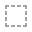
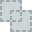
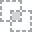
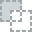
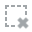
...
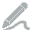
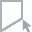
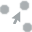
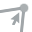
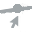

In [14]:
# plot
plot(df_0)

## plot for 2 level 


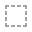
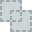
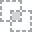
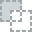
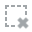
...
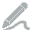
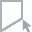
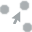
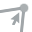
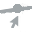

In [15]:
plot(df_2)

## plot for 3 level 


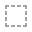
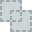
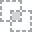
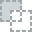
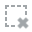
...
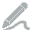
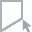
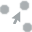
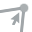
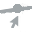

In [16]:
plot(df_2)

## create report

DataPrep Report
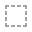
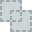
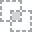
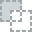
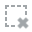
...
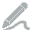
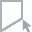
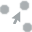
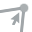
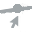

In [17]:
create_report(df_0)

DataPrep Report
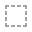
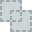
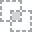
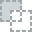
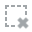
...
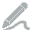
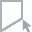
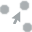
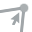
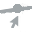

In [18]:
create_report(df_1)

DataPrep Report
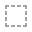
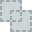
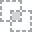
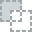
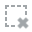
...
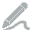
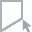
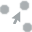
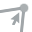
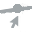

In [19]:
create_report(df_2)

## Preproc

In [20]:
import re

In [21]:
# mapping
contraction_mapping = {"ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not",

                           "didn't": "did not", "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not",

                           "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",

                           "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would",

                           "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would",

                           "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam",

                           "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have",

                           "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock",

                           "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have",

                           "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is",

                           "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as",

                           "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would",

                           "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have",

                           "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have",

                           "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are",

                           "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",

                           "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is",

                           "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have",

                           "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have",

                           "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all",

                           "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have",

                           "you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have",

                           "you're": "you are", "you've": "you have"}

In [22]:
def clean_text(text):
    text=' '.join([contraction_mapping[i] if i in contraction_mapping.keys() else i for i in text.split()])
    text=re.sub("'s","",text)
    text=' '.join([i for i in text.split() if i.isalpha()])
    text=re.sub('[^a-zA-Z]'," ",text)
    
    return text

In [23]:
content = df_train[['labels', 'content']]
content['content'] = content['content'].apply(clean_text)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [24]:
content.head()

,labels,content
0,0,When you see the word the first thing you thin...
1,0,To Amsterdam still seems very Recently the May...
2,0,a music star from has millions of but she is a...
3,0,Google has made maps of the highest the ocean ...
4,0,The auction of a Banksy painting that disappea...


### NAMES

In [25]:
import wget

wget.download('http://www.gutenberg.org/files/3201/files/NAMES.TXT', 'first-names.txt')

'first-names (2).txt'

In [26]:
with open('first-names.txt', 'rb') as f:
  names_encoded = f.readlines()

names = []
for name in names_encoded:
  try:
    names.append(name.rstrip().decode('utf-8'))
  except:
    continue

names.remove('The')
print(f'NUmber of names: {len(names)}')

NUmber of names: 21984


In [27]:
names[1002:1020]

['Ansilme',
 'Ansley',
 'Anson',
 'Anstice',
 'Anstus',
 'Antebi',
 'Anthe',
 'Anthea',
 'Anthia',
 'Anthiathia',
 'Anthony',
 'Antin',
 'Antipas',
 'Antipus',
 'Antoine',
 'Antoinetta',
 'Antoinette',
 'Anton']

In [28]:
def check_name(text):
    for wrd in text.split(' '):
        if wrd in names:
          text = re.sub(wrd, '*n'+wrd,text)
    return text

In [29]:
strr='Anton and Antipus and Antoine The victor is Valentin'

check_name(strr)

'*nAnton and *nAntipus and *nAntoine The victor is *nValentin'

In [30]:
%%time
content['content']=content['content'].apply(check_name)

CPU times: user 1min 18s, sys: 28.5 ms, total: 1min 18s
Wall time: 1min 18s


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [54]:
sentences=content.content.values
labels=content.labels.values

## tf-idf, word2vec, xgb



In [32]:
from gensim.models import word2vec

'pattern' package not found; tag filters are not available for English


In [33]:
model = word2vec.Word2Vec(content['content'], size=300, window=8, workers=4)

w2v = dict(zip(model.wv.index2word, model.wv.syn0))

collecting all words and their counts
Each 'sentences' item should be a list of words (usually unicode strings). First item here is instead plain <class 'str'>.
PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
collected 54 word types from a corpus of 1830712 raw words and 567 sentences
Loading a fresh vocabulary
effective_min_count=5 retains 54 unique words (100% of original 54, drops 0)
effective_min_count=5 leaves 1830712 word corpus (100% of original 1830712, drops 0)
deleting the raw counts dictionary of 54 items
sample=0.001 downsamples 25 most-common words
downsampling leaves estimated 345094 word corpus (18.9% of prior 1830712)
estimated required memory for 54 words and 300 dimensions: 156600 bytes
resetting layer weights
training model with 4 workers on 54 vocabulary and 300 features, using sg=0 hs=0 sample=0.001 negative=5 window=8
worker thread finished; awaiting finish of 3 more threads
worker thread finished; awaiting finish of 2 more threads
worker thread 

In [34]:
class mean_vectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        self.dim = len(next(iter(w2v.values())))

    def fit(self, X):
        return self 
    
    def transform(self, X):
        return np.array([
            np.mean([self.word2vec[w] for w in words if w in self.word2vec] 
                    or [np.zeros(self.dim)], axis=0)
            for words in X
        ])

In [35]:
data_mean = mean_vectorizer(w2v).fit(content['content']).transform(content['content'])
data_mean.shape

(567, 300)

In [36]:
from sklearn.model_selection import train_test_split

labels = content['labels']
Xtr, Xval, ytr, yval = train_test_split(data_mean, labels, test_size=0.1, shuffle=True)

Xtr.shape,Xval.shape,ytr.mean(),yval.mean()

((510, 300), (57, 300), 1.0058823529411764, 0.9473684210526315)

In [37]:
import xgboost as xgb

dtr = xgb.DMatrix(Xtr, label= ytr,missing = np.nan)
dval = xgb.DMatrix(Xval, label= yval,missing = np.nan)
watchlist = [(dtr, 'train'), (dval, 'eval')]
history = dict()

In [38]:
params = {
    'max_depth': 26,
    'eta': 0.005,
    'nthread': 4,
    'gamma' : 1,
    'alpha' : 1,
    'subsample': 0.85,
    'eval_metric': ['merror'],
    'objective': 'multi:softmax',
    'colsample_bytree': 0.9,
    'min_child_weight': 100,
    'scale_pos_weight':(1)/labels.mean(),
    'seed':7,
    'num_class':3
}

In [39]:
model_new = xgb.train(params, dtr, num_boost_round=150, evals=watchlist, evals_result=history, verbose_eval=20)

[0]	train-merror:0.672549	eval-merror:0.614035
[20]	train-merror:0.660784	eval-merror:0.719298
[40]	train-merror:0.660784	eval-merror:0.719298
[60]	train-merror:0.660784	eval-merror:0.719298
[80]	train-merror:0.660784	eval-merror:0.719298
[100]	train-merror:0.660784	eval-merror:0.719298
[120]	train-merror:0.660784	eval-merror:0.719298
[140]	train-merror:0.660784	eval-merror:0.719298
[149]	train-merror:0.660784	eval-merror:0.719298


In [40]:
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import defaultdict

class tfidf_vectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        self.word2weight = None
        self.dim = len(next(iter(w2v.values())))

    def fit(self, X):
        tfidf = TfidfVectorizer(analyzer=lambda x: x)
        tfidf.fit(X)
        max_idf = max(tfidf.idf_)
        self.word2weight = defaultdict(
            lambda: max_idf,
            [(w, tfidf.idf_[i]) for w, i in tfidf.vocabulary_.items()])

        return self

    def transform(self, X):
        return np.array([
                np.mean([self.word2vec[w] * self.word2weight[w]
                         for w in words if w in self.word2vec] or
                        [np.zeros(self.dim)], axis=0)
                for words in X
            ])

In [41]:
data_mean = tfidf_vectorizer(w2v).fit(content['content']).transform(content['content'])
labels = content['labels']
Xtr, Xval, ytr, yval = train_test_split(data_mean, labels, test_size=0.15, shuffle=True)

Xtr.shape,Xval.shape,ytr.mean(),yval.mean()

((481, 300), (86, 300), 0.9812889812889813, 1.1046511627906976)

In [42]:
dtr = xgb.DMatrix(Xtr, label= ytr,missing = np.nan)
dval = xgb.DMatrix(Xval, label= yval,missing = np.nan)
watchlist = [(dtr, 'train'), (dval, 'eval')]
history = dict()

In [43]:
model_new = xgb.train(params, dtr, num_boost_round=150, evals=watchlist, evals_result=history, verbose_eval=20)

[0]	train-merror:0.659044	eval-merror:0.709302
[20]	train-merror:0.661123	eval-merror:0.697674
[40]	train-merror:0.661123	eval-merror:0.697674
[60]	train-merror:0.661123	eval-merror:0.697674
[80]	train-merror:0.659044	eval-merror:0.709302
[100]	train-merror:0.659044	eval-merror:0.709302
[120]	train-merror:0.659044	eval-merror:0.709302
[140]	train-merror:0.659044	eval-merror:0.709302
[149]	train-merror:0.659044	eval-merror:0.709302


# BERT

In [44]:
!pip install transformers

In [55]:
from transformers import AutoModel, AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained("bert-base-cased")

print(' Original: ', sentences[0])
print('Tokenized: ', tokenizer.tokenize(sentences[0]))
print('Token IDs: ', tokenizer.convert_tokens_to_ids(tokenizer.tokenize(sentences[0])))
print('Tokenized len: ', len(tokenizer.tokenize(sentences[0])))

 Original:  When you see the word the first thing you think of the biggest the longest river or the largest internet shop and which do you think is most These are the questions in a debate about the Brazil and Peru have made objections to a bid made by the US online shop for the domain Amazon has asked for its company name to be a domain name but the South American governments say this would stop the use of this internet address for environmental indigenous rights and other public interest There are many other disputed claims to including Until the differences between governmental and other types of identity were easy to see in every internet address by the use of and other But soon there are going to be more of these categories or generic domains as they are technically The Internet Corporation for Assigned *nNames and Numbers has had bids worth almost for hundreds of new gTLDs to add to the that we use Amazon has applied for many new including and But the one that has caused most dis

In [56]:
tokenizer_un = AutoTokenizer.from_pretrained("bert-base-uncased")

print(' Original: ', sentences[0])
print('Tokenized: ', tokenizer_un.tokenize(sentences[0]))
print('Token IDs: ', tokenizer_un.convert_tokens_to_ids(tokenizer.tokenize(sentences[0])))
print('Tokenized len: ', len(tokenizer_un.tokenize(sentences[0])))

 Original:  When you see the word the first thing you think of the biggest the longest river or the largest internet shop and which do you think is most These are the questions in a debate about the Brazil and Peru have made objections to a bid made by the US online shop for the domain Amazon has asked for its company name to be a domain name but the South American governments say this would stop the use of this internet address for environmental indigenous rights and other public interest There are many other disputed claims to including Until the differences between governmental and other types of identity were easy to see in every internet address by the use of and other But soon there are going to be more of these categories or generic domains as they are technically The Internet Corporation for Assigned *nNames and Numbers has had bids worth almost for hundreds of new gTLDs to add to the that we use Amazon has applied for many new including and But the one that has caused most dis

In [57]:
input_ids = []
for sent in sentences:
    encoded_sent = tokenizer.encode(
                        sent,                      
                        add_special_tokens = True,)
    
 
    input_ids.append(encoded_sent)

Token indices sequence length is longer than the specified maximum sequence length for this model (644 > 512). Running this sequence through the model will result in indexing errors


In [58]:
from keras.preprocessing.sequence import pad_sequences

MAX_LEN = 256
input_ids = pad_sequences(input_ids, maxlen=MAX_LEN , truncating="post", padding="post")

In [59]:
attention_masks = []

for sent in input_ids:
    att_mask = [int(token_id > 0) for token_id in sent]
    attention_masks.append(att_mask)

In [60]:
import torch

In [61]:
if torch.cuda.is_available():      
    device = torch.device("cuda")

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

In [62]:
from sklearn.model_selection import train_test_split

train_inputs, validation_inputs, train_labels, validation_labels = train_test_split(input_ids, labels, 
                                                            random_state=2018, test_size=0.1)
train_masks, validation_masks, _, _ = train_test_split(attention_masks, labels,
                                             random_state=2018, test_size=0.1)

In [63]:
train_inputs = torch.tensor(train_inputs)
validation_inputs = torch.tensor(validation_inputs)

train_labels = torch.tensor(train_labels)
validation_labels = torch.tensor(validation_labels)

train_masks = torch.tensor(train_masks)
validation_masks = torch.tensor(validation_masks)

In [64]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

batch_size = 32 # can try 64

# DataLoader for our training 
train_data = TensorDataset(train_inputs, train_masks, train_labels)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# DataLoader for our test
validation_data = TensorDataset(validation_inputs, validation_masks, validation_labels)
validation_sampler = SequentialSampler(validation_data)
validation_dataloader = DataLoader(validation_data, sampler=validation_sampler, batch_size=batch_size)


In [65]:
from transformers import BertForSequenceClassification, AdamW, BertConfig


model = BertForSequenceClassification.from_pretrained(
    "bert-base-cased",
    num_labels = 3,
    output_attentions = False,
    output_hidden_states = False,
)

model.cuda()


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertForSequenceClassification: ['cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at b

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(28996, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

In [68]:
optimizer = AdamW(model.parameters(),
                  lr = 1e-5,
                  eps = 1e-8 
                )

In [69]:
from transformers import get_linear_schedule_with_warmup

epochs = 8
total_steps = len(train_dataloader) * epochs

scheduler = get_linear_schedule_with_warmup(optimizer, 
                                            num_warmup_steps = 0,
                                            num_training_steps = total_steps)

In [70]:
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

In [72]:
import time
import datetime

def format_time(elapsed):
    elapsed_rounded = int(round((elapsed)))
    
    return str(datetime.timedelta(seconds=elapsed_rounded))

In [73]:
import random

seed_val = 42

random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

loss_values = []

for epoch_i in range(0, epochs):

    print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
    t0 = time.time()
    total_loss = 0
    model.train()

    for step, batch in enumerate(train_dataloader):

        if step % 40 == 0 and not step == 0:
            elapsed = format_time(time.time() - t0)
            
            print('Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(train_dataloader), elapsed))
        b_input_ids = batch[0].to(device)
        b_input_mask = batch[1].to(device)
        b_labels = batch[2].to(device)

        model.zero_grad()        

        b_input_ids = torch.tensor(b_input_ids).to(device).long()
        outputs = model(b_input_ids, 
                    token_type_ids=None, 
                    attention_mask=b_input_mask, 
                    labels=b_labels)
        
        loss = outputs[0]
        total_loss += loss.item()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        optimizer.step()
        scheduler.step()

    avg_train_loss = total_loss / len(train_dataloader)            
    loss_values.append(avg_train_loss)

    print("")
    print("Running Validation...")

    t0 = time.time()

    model.eval()
    eval_loss, eval_accuracy = 0, 0
    nb_eval_steps, nb_eval_examples = 0, 0

    for batch in validation_dataloader:
        
        batch = tuple(t.to(device) for t in batch)        
        b_input_ids, b_input_mask, b_labels = batch

        with torch.no_grad():        
            
            b_input_ids = torch.tensor(b_input_ids).to(device).long()
            outputs = model(b_input_ids, 
                            token_type_ids=None, 
                            attention_mask=b_input_mask)
        
        logits = outputs[0]

        logits = logits.detach().cpu().numpy()
        label_ids = b_labels.to('cpu').numpy()

        tmp_eval_accuracy = flat_accuracy(logits, label_ids)
        
        eval_accuracy += tmp_eval_accuracy
        nb_eval_steps += 1

    print("Accuracy: {0:.2f}".format(eval_accuracy/nb_eval_steps))
    print("Validation took: {:}".format(format_time(time.time() - t0)))

======== Epoch 1 / 8 ========


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



Running Validation...


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Accuracy: 0.39
Validation took: 0:00:01
======== Epoch 2 / 8 ========

Running Validation...
Accuracy: 0.83
Validation took: 0:00:01
======== Epoch 3 / 8 ========

Running Validation...
Accuracy: 0.88
Validation took: 0:00:01
======== Epoch 4 / 8 ========

Running Validation...
Accuracy: 0.88
Validation took: 0:00:01
======== Epoch 5 / 8 ========

Running Validation...
Accuracy: 0.85
Validation took: 0:00:01
======== Epoch 6 / 8 ========

Running Validation...
Accuracy: 0.88
Validation took: 0:00:01
======== Epoch 7 / 8 ========

Running Validation...
Accuracy: 0.92
Validation took: 0:00:01
======== Epoch 8 / 8 ========

Running Validation...
Accuracy: 0.92
Validation took: 0:00:01


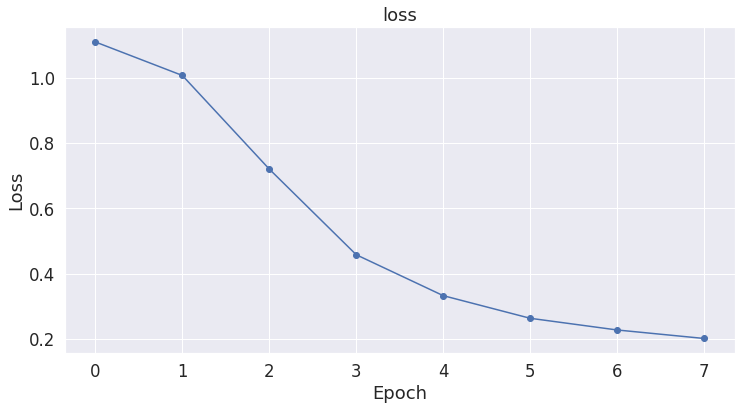

In [74]:
# import matplotlib.pyplot as plt
# % matplotlib inline

# import seaborn as sns
sns.set(style='darkgrid')

sns.set(font_scale=1.5)
plt.rcParams["figure.figsize"] = (12,6)

plt.plot(loss_values, 'b-o')

plt.title("loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.show()

In [75]:
!pip freeze > requirements.txt